<a href="https://colab.research.google.com/github/jpisarek/background-in-image-classification/blob/master/master_thesis_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from keras.models import Sequential
from os.path import join
import os
from PIL import Image
import numpy as np
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
from keras.optimizers import Adam, RMSprop, SGD
from keras.applications import VGG19, VGG16, ResNet50
from keras.layers import Flatten, Dense, Dropout, Softmax, Conv2D, MaxPooling2D, Activation, BatchNormalization, GlobalAveragePooling2D
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications import EfficientNetB0
from keras.models import Model
from tensorflow.keras import regularizers

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
device_name = '/device:GPU:0'

# Wczytanie i wektoryzacja danych

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir dataset

In [ ]:
!unzip drive/MyDrive/Praca\ magisterska/original244_244.zip -d /dataset

In [ ]:
!cd /dataset
!ls -l

total 234924
-rw-r--r-- 1 root root     57568 Apr  1 13:36 Confusion_matrix_concrete.jpg
drwxr-xr-x 2 root root      4096 Apr  1 12:09 dataset
drwx------ 6 root root      4096 Apr  1 12:09 drive
drwxr-xr-x 1 root root      4096 Mar 25 13:38 sample_data
-rw-r--r-- 1 root root 240487536 Apr  1 13:19 sign_classifier.h5


In [ ]:
dataset_dir = "/dataset/original/val"
input_size =(224, 224, 3)

In [ ]:
classes =[]
for f in os.listdir(dataset_dir):
        if not f.startswith('.'):
            classes.append(f)
classes
classes.sort()
classes

['00_dog',
 '01_bird',
 '02_wheeled vehicle',
 '03_reptile',
 '04_carnivore',
 '05_insect',
 '06_musical instrument',
 '07_primate',
 '08_fish']

In [ ]:
idx_classes_dict = dict(enumerate(classes))
classes_idx_dict = {v: k for k, v in idx_classes_dict.items()}
idx_classes_dict

{0: '00_dog',
 1: '01_bird',
 2: '02_wheeled vehicle',
 3: '03_reptile',
 4: '04_carnivore',
 5: '05_insect',
 6: '06_musical instrument',
 7: '07_primate',
 8: '08_fish'}

**--- Dzielimy zbiór na treningowy i uczący ---**

In [ ]:
out_dir: str = "/dataset/generator_results"

if os.path.exists(out_dir) and os.path.isdir(out_dir):
    shutil.rmtree(out_dir)

In [ ]:
import errno
import random
from typing import List
import shutil

def create_symlink(src, dst):
    """
    Args:
        src: Path to source file
        dst: Path to destination symlink that will be created
    """
    try:
        # Try to create a symlink
        os.symlink(src, dst)
    except OSError as e:
        if e.errno == errno.EEXIST:
            # If the symlink already exists, remove it...
            os.remove(dst)
            # And create a new one
            os.symlink(src, dst)


out_dir: str = "/dataset/generator_results"

if os.path.exists(out_dir) and os.path.isdir(out_dir):
    shutil.rmtree(out_dir)

balance_data: bool = True
train_size: float = 0.7

if balance_data:
    num_examples = {}
    for cls in classes:
        num_examples[cls] = len(
            [file for file in os.listdir(os.path.join(dataset_dir, cls))])
        
        print(num_examples)


for cls in classes:
        # Returns full paths to files from a given class
        files = [os.path.join(dataset_dir, cls, file) for file in \
                 os.listdir(os.path.join(dataset_dir, cls))]
        random.shuffle(files)

        if balance_data:
            least_examples = min(num_examples.values())
            files = files[:least_examples]

        print(files)

        """
            Use sklearn library function to automatically split the data. It can't, however,
            directly split the data into three datasets so we need to run it twice. First, split the
            data into train (70%) and combined val and test (30%). Then split val_test into half
            (15% of whole dataset for val and 15% for test).
        """
        train, val_test = train_test_split(files, test_size=(1. - train_size))
        val, test = train_test_split(val_test, test_size=0.5)

        train_dir = os.path.join(out_dir, 'train', cls)
        val_dir = os.path.join(out_dir, 'val', cls)
        test_dir = os.path.join(out_dir, 'test', cls)
        os.makedirs(train_dir, exist_ok=True)
        os.makedirs(val_dir, exist_ok=True)
        os.makedirs(test_dir, exist_ok=True)

        for file in train:
            dst = os.path.join(train_dir, os.path.basename(file))
            create_symlink(src=file, dst=dst)

        for file in val:
            dst = os.path.join(val_dir, os.path.basename(file))
            create_symlink(src=file, dst=dst)

        for file in test:
            dst = os.path.join(test_dir, os.path.basename(file))
            create_symlink(src=file, dst=dst)

In [ ]:
train_dir_main = os.path.join(out_dir, 'train')
val_dir_main = os.path.join(out_dir, 'val')
test_dir_main = os.path.join(out_dir, 'test')

Text(0.5, 1.0, 'Number of training images per category:')

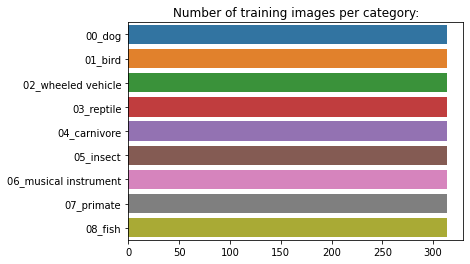

In [ ]:
import seaborn as sns

category_names = sorted(os.listdir(train_dir_main))
number_categories = len(category_names)
img_pr_cat = []
for category in category_names:
    folder = train_dir_main + '/' + category
    img_pr_cat.append(len(os.listdir(folder)))   
sns.barplot(y=category_names, x=img_pr_cat).set_title("Number of training images per category:")

In [ ]:
#from keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications.resnet50 import preprocess_input

train_datagen=ImageDataGenerator(preprocessing_function=preprocess_input)

#train_datagen = ImageDataGenerator(rescale=1./ 255.,
#                                   shear_range=0.2,
#                                   zoom_range=0.2,
#                                   vertical_flip=True)



#train_datagen = ImageDataGenerator( rescale=1./ 255.,
 #                                   shear_range = 0.2,
  #                                  vertical_flip=True,
   #                                 zoom_range=0.1,
    #                                preprocessing_function=preprocess_input)

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator=train_datagen.flow_from_directory(train_dir_main,
                                                 target_size=(224,224),
                                                 batch_size=8,
                                                 class_mode='categorical'
                                                 )

validation_generator = test_datagen.flow_from_directory(
                                                val_dir_main, 
                                                target_size=(224,224),
                                                batch_size=8,
                                                class_mode='categorical',
                                                shuffle=False
                                                ) 

test_generator = test_datagen.flow_from_directory(
                                                test_dir_main, 
                                                target_size=(224,224),
                                                batch_size=8,
                                                class_mode='categorical',
                                                shuffle=False
                                                ) 

Found 2826 images belonging to 9 classes.
Found 612 images belonging to 9 classes.
Found 612 images belonging to 9 classes.


# Architektury

## Transfer learning sieci VGG19

In [ ]:
def vgg19(input_shape, classes):
    model = Sequential()
    convolution_base = VGG19(weights='imagenet',
                             include_top=False,
                             input_shape=input_shape)
    model.add(convolution_base)
    model.add(Flatten())
    model.add(Dense(500, activation='relu'))
    model.add(Dense(250, activation='relu'))
    model.add(Dense(classes, activation='sigmoid'))

    for layer in convolution_base.layers[:-13]:
      layer.trainable = False

    model.compile(loss='categorical_crossentropy',
                  optimizer=RMSprop(lr=2e-5),   
                  metrics=['acc'])
    return model

model = vgg19(input_size, 9)

In [ ]:
from keras.callbacks import ModelCheckpoint

learning_rate = 5e-5
epochs = 10
checkpoint = ModelCheckpoint("sign_classifier.h5", monitor = 'val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
model.compile(loss="categorical_crossentropy", optimizer=Adam(lr=learning_rate, clipnorm = 1.), metrics = ['acc'])

In [ ]:
step_size_train = train_generator.n/train_generator.batch_size
step_size_val = validation_generator.samples // validation_generator.batch_size

fit_history = model.fit_generator(train_generator,
                     steps_per_epoch=step_size_train,
                     epochs=15,
                     shuffle=True, 
                     validation_data=validation_generator,
                     validation_steps=step_size_val,
                     callbacks = [checkpoint],
                     verbose=1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/15
353/353 [==============================] - 155s 431ms/step - loss: 2.5481 - acc: 0.2913 - val_loss: 0.9954 - val_acc: 0.6349

Epoch 00001: val_acc improved from -inf to 0.63487, saving model to sign_classifier.h5
Epoch 2/15
353/353 [==============================] - 152s 430ms/step - loss: 0.7063 - acc: 0.7684 - val_loss: 0.6803 - val_acc: 0.7829

Epoch 00002: val_acc improved from 0.63487 to 0.78289, saving model to sign_classifier.h5
Epoch 3/15
353/353 [==============================] - 152s 430ms/step - loss: 0.2262 - acc: 0.9242 - val_loss: 0.7456 - val_acc: 0.7500

Epoch 00003: val_acc did not improve from 0.78289
Epoch 4/15
353/353 [==============================] - 152s 430ms/step - loss: 0.1145 - acc: 0.9687 - val_loss: 0.6626 - val_acc: 0.8322

Epoch 00004: val_acc improved from 0.78289 to 0.83224, saving model to sign_classifier.h5
Epoch 5/15
353/353 [==============================] - 152s 430ms/step - loss: 0.0591 - acc: 0.9849 - val_loss: 1.3019 - val_acc: 0.7401

## Transfer learning sieci ResNet

In [ ]:
def resNet(input_shape, classes):
    base_model = ResNet50(include_top=False, weights='imagenet', input_shape=input_shape)

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(32,activation='relu')(x)
    x = Dense(16,activation='relu')(x)
    x = Dropout(0.5)(x)
    preds = Dense(classes, activation='softmax')(x) #final layer with softmax activation
    model = Model(inputs=base_model.input,outputs=preds)

    # for l in base_model.layers:
    #   l.trainable = False

    for layer in base_model.layers[:143]:
      layer.trainable = False
    for layer in base_model.layers[143:]:
      layer.trainable = True

    model.compile(loss='categorical_crossentropy',
                  optimizer=Adam(lr=1e-3),   
                  metrics=['acc'])
    return model

model = resNet(input_size, 9)

In [ ]:
from keras.callbacks import ModelCheckpoint

learning_rate = 1e-5
epochs = 10
checkpoint = ModelCheckpoint("sign_classifier_resNet.h5", monitor = 'val_acc', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', period=1)
model.compile(loss="categorical_crossentropy", optimizer=Adam(lr=learning_rate, clipnorm = 1.), metrics = ['acc'])

In [ ]:
step_size_train = train_generator.n/train_generator.batch_size
step_size_val = validation_generator.samples // validation_generator.batch_size

fit_history = model.fit_generator(train_generator,
                     steps_per_epoch=step_size_train,
                     epochs=15,
                     validation_data=validation_generator,
                     validation_steps=step_size_val,
                     callbacks = [checkpoint],
                     verbose=1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/15
353/353 [==============================] - 27s 64ms/step - loss: 2.3966 - acc: 0.1865 - val_loss: 1.6421 - val_acc: 0.4211

Epoch 00001: val_acc improved from -inf to 0.42105, saving model to sign_classifier_resNet.h5
Epoch 2/15
353/353 [==============================] - 22s 61ms/step - loss: 1.7553 - acc: 0.3300 - val_loss: 1.2033 - val_acc: 0.5970

Epoch 00002: val_acc improved from 0.42105 to 0.59704, saving model to sign_classifier_resNet.h5
Epoch 3/15
353/353 [==============================] - 22s 62ms/step - loss: 1.4463 - acc: 0.4414 - val_loss: 0.9169 - val_acc: 0.7155

Epoch 00003: val_acc improved from 0.59704 to 0.71546, saving model to sign_classifier_resNet.h5
Epoch 4/15
353/353 [==============================] - 22s 62ms/step - loss: 1.2461 - acc: 0.5248 - val_loss: 0.6849 - val_acc: 0.8421

Epoch 00004: val_acc improved from 0.71546 to 0.84211, saving model to sign_classifier_resNet.h5
Epoch 5/15
353/353 [==============================] - 22s 61ms/step - loss:

In [ ]:
for i, layer in enumerate(model.layers):
   print(i, layer.name)

In [ ]:
for layer in conv_base.layers:
    print(layer, layer.trainable)

In [ ]:
model.summary()

# Statystyki z trenowania

In [ ]:
from tensorflow.python.keras.models import load_model
model = load_model("sign_classifier_resNet.h5")

In [ ]:
print(fit_history.history.keys())

dict_keys(['loss', 'acc', 'val_loss', 'val_acc'])


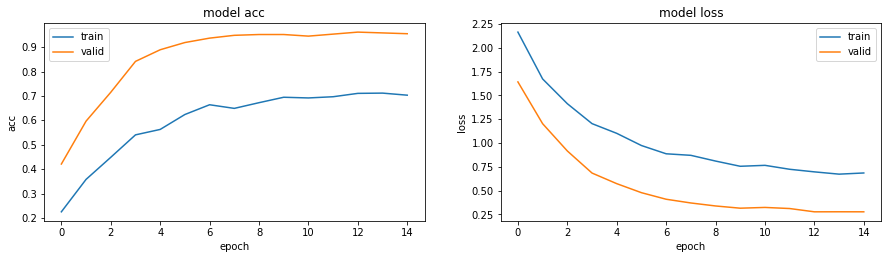

In [ ]:
import matplotlib.pyplot as plt

plt.figure(1, figsize = (15,8)) 
    
plt.subplot(221)  
plt.plot(fit_history.history['acc'])  
plt.plot(fit_history.history['val_acc'])  
plt.title('model acc')  
plt.ylabel('acc')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 
    
plt.subplot(222)  
plt.plot(fit_history.history['loss'])  
plt.plot(fit_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import itertools

def plot_confusion_matrix(cm, classes, figname,
                          normalize=False, title="Confusion matrix", cmap=plt.cm.Blues):
    if normalize:
      cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]
      print("Normalized confusion matrix")
    else:
      print("Confusion matrix, without normalization")
    plt.figure(figsize=(8,8))
    plt.imshow(cm, interpolation="nearest", cmap=cmap)
    plt.title(title)
  #plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    fmt = ".2f" if normalize else "d"
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, format(cm[i, j], fmt),
      horizontalalignment="center",
      color="white" if cm[i, j] > thresh else "black")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.tight_layout()
    plt.savefig(figname)


In [ ]:
#!mkdir dataset_only_fg

In [ ]:
#!unzip drive/MyDrive/Praca\ magisterska/only_fg.zip -d /dataset_only_fg

In [ ]:
#background_test_dir: str = "/dataset_only_fg/only_fg/val"

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Confusion matrix, without normalization


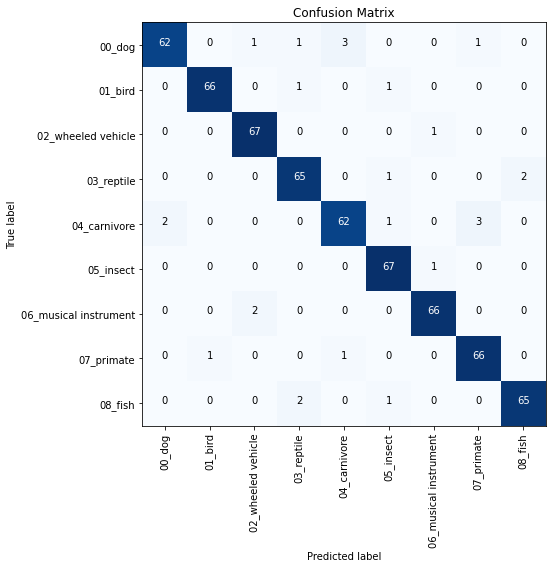

In [ ]:
from sklearn.metrics import confusion_matrix

# test_datagen2 = ImageDataGenerator(preprocessing_function=preprocess_input)
# test_generator2 = test_datagen2.flow_from_directory(
#                                                 background_test_dir, 
#                                                 target_size=(224,224),
#                                                 batch_size=8,
#                                                 class_mode='categorical',
#                                                 shuffle=False
#                                                 )

Y_pred = model.predict_generator(test_generator)
y_pred = np.argmax(Y_pred, axis=1)

cm = confusion_matrix(test_generator.classes, y_pred)
plot_confusion_matrix(cm, classes = category_names, title='Confusion Matrix', normalize=False, figname = 'Confusion_matrix_concrete.jpg')

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(test_generator.classes, y_pred)
print("Accuracy in test set: %0.1f%% " % (accuracy * 100))

Accuracy in test set: 95.8% 


# Zapis modelu 

In [ ]:
score=model.evaluate(validation_generator, verbose=1)
print('Test loss: ', score[0])
print('Test accuracy: ', score[1])

77/77 [==============================] - 4s 35ms/step - loss: 0.2763 - acc: 0.9624
Test loss:  0.27626699209213257
Test accuracy:  0.9624183177947998


In [ ]:
from keras.models import model_from_json

model_json = model.to_json()
with open("drive/MyDrive/Praca magisterska/modelResNet.json", "w") as json_file:
    json_file.write(model_json)
model.save_weights("drive/MyDrive/Praca magisterska//modelResNet.h5")

**--- Załadowanie wytrenowanego modelu ---**

In [ ]:
from keras.models import model_from_json

json_file = open("drive/MyDrive/Praca magisterska/modelResNet.json", "r")
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("drive/MyDrive/Praca magisterska/modelResNet.h5", by_name=True, skip_mismatch=False)

loaded_model.compile(loss='categorical_crossentropy',
                  optimizer=RMSprop(lr=2e-4),   
                  metrics=['acc'])
score=loaded_model.evaluate(validation_generator, verbose=1)
print('Test loss: ', score[0])
print('Test accuracy: ', score[1])

77/77 [==============================] - 4s 35ms/step - loss: 0.2105 - acc: 0.9611
Test loss:  0.24565905332565308
Test accuracy:  0.9673202633857727


# Załadowanie danych testowych z folderu "test" do sprawdzenia predykcji wytrenowanej sieci

In [ ]:
#dataset_dir_test = "drive/MyDrive/Praca magisterska/test"
test_dir_main = os.path.join(out_dir, 'test')
test_dir_main

'/dataset/generator_results/test'

In [ ]:
import pandas as pd
from sklearn.metrics import confusion_matrix
from tensorflow.python.keras.models import load_model
from keras.models import model_from_json

report = pd.DataFrame(
    index=np.arange(4),
    columns=['Precision', 'Recall', 'Accuracy',
             'F1-score'])

loaded_model = load_model("sign_classifier_resNet.h5")

predictions = loaded_model.predict(test_generator,
                                      steps=len(test_generator), verbose=1)
ground_truth = test_generator.classes
ground_truth = to_categorical(ground_truth, len(set(ground_truth)))

# predictions[predictions < 0.5] = 0
# predictions[predictions >= 0.5] = 1

b = np.zeros_like(predictions)
b[np.arange(len(predictions)), predictions.argmax(1)] = 1

print(b)
print(ground_truth)

# tn, fp, fn, tp = confusion_matrix(ground_truth.argmax(axis=1),
#                                   predictions.argmax(axis=1)).ravel()

CM = confusion_matrix(ground_truth.argmax(axis=1), b.argmax(axis=1))

print(CM)

# fp = CM.sum() - np.diag(CM)  
# fn = CM.sum() - np.diag(CM)
# tp = np.diag(CM)
# tn = CM.sum() - (FP + FN + TP)

# precision = tp / (tp + fp)
# recall = tp / (tp + fn)
# f1 = 2 * (precision * recall) / (precision + recall)

# accuracy = (tp + tn) / (tp + tn + fp + fn)

#importing accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
print('\nAccuracy: {:.2f}\n'.format(accuracy_score(ground_truth, b)))

print('Micro Precision: {:.2f}'.format(precision_score(ground_truth, b, average='micro')))
print('Micro Recall: {:.2f}'.format(recall_score(ground_truth, b, average='micro')))
print('Micro F1-score: {:.2f}\n'.format(f1_score(ground_truth, b, average='micro')))

print('Macro Precision: {:.2f}'.format(precision_score(ground_truth, b, average='macro')))
print('Macro Recall: {:.2f}'.format(recall_score(ground_truth, b, average='macro')))
print('Macro F1-score: {:.2f}\n'.format(f1_score(ground_truth, b, average='macro')))

print('Weighted Precision: {:.2f}'.format(precision_score(ground_truth, b, average='weighted')))
print('Weighted Recall: {:.2f}'.format(recall_score(ground_truth, b, average='weighted')))
print('Weighted F1-score: {:.2f}'.format(f1_score(ground_truth, b, average='weighted')))

from sklearn.metrics import classification_report
print('\nClassification Report\n')
print(classification_report(ground_truth, b, target_names=['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6', 'Class 7', 'Class 8', 'Class 9']))

# report = [precision, recall, accuracy, f1]
# print(report)

77/77 [==============================] - 3s 33ms/step
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
[[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 1.]]
[[62  0  1  1  3  0  0  1  0]
 [ 0 66  0  1  0  1  0  0  0]
 [ 0  0 67  0  0  0  1  0  0]
 [ 0  0  0 65  0  1  0  0  2]
 [ 2  0  0  0 62  1  0  3  0]
 [ 0  0  0  0  0 67  1  0  0]
 [ 0  0  2  0  0  0 66  0  0]
 [ 0  1  0  0  1  0  0 66  0]
 [ 0  0  0  2  0  1  0  0 65]]

Accuracy: 0.96

Micro Precision: 0.96
Micro Recall: 0.96
Micro F1-score: 0.96

Macro Precision: 0.96
Macro Recall: 0.96
Macro F1-score: 0.96

Weighted Precision: 0.96
Weighted Recall: 0.96
Weighted F1-score: 0.96

Classification Report

              precision    recall  f1-score   support

     Class 1       0.97      0.91      0.94        68
     Class 2    

In [ ]:
def _image_to_array(filename, target_size=input_size):
    img = Image.open(filename)
    img.load()
    if img.mode != 'RGB':
        img = img.convert('RGB')
    img = img.resize(target_size)
    x = np.asarray(img, dtype="int32")
    return x

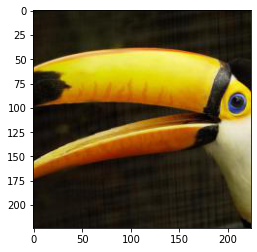

[[0.06276185 0.22313097 0.06549551 0.04695853 0.02522479 0.27818474
  0.1696658  0.02301434 0.10556343]]
[5]
Zdjęcie należy do klasy: 05_insect


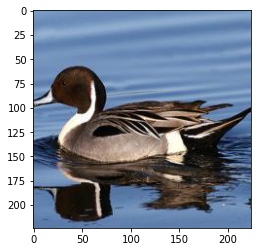

[[3.4758041e-03 9.2149466e-01 2.6908747e-03 6.6136546e-04 3.4279903e-05
  7.1040176e-02 2.1412317e-04 3.1712875e-04 7.1654933e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


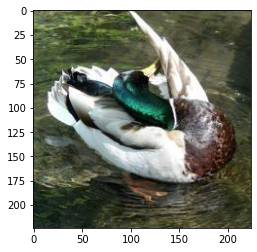

[[2.1286320e-03 6.6956371e-04 6.1814656e-04 8.4022087e-01 6.4707291e-03
  5.0302963e-03 4.2726839e-04 3.4529645e-02 1.0990494e-01]]
[3]
Zdjęcie należy do klasy: 03_reptile


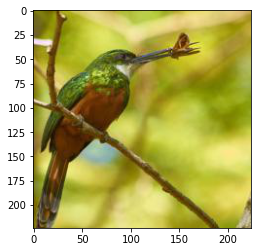

[[1.2363002e-02 8.2877558e-01 1.3529873e-02 2.5441477e-03 3.4681984e-04
  1.3877615e-01 1.1090458e-03 1.7510836e-03 8.0435880e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


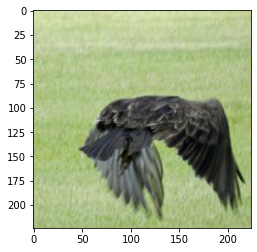

[[1.6082136e-02 7.4723256e-01 2.0681230e-02 2.5435372e-03 7.6643605e-04
  2.0718206e-01 6.2424497e-04 3.8052564e-03 1.0825832e-03]]
[1]
Zdjęcie należy do klasy: 01_bird


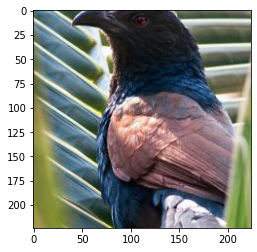

[[1.4324054e-03 9.1706610e-01 1.6779104e-03 1.0260881e-04 8.0033960e-06
  7.9569653e-02 1.4322237e-05 1.1343168e-04 1.5568703e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


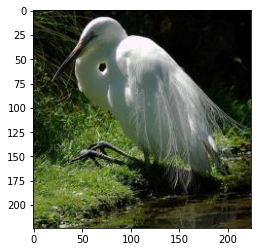

[[0.04032874 0.61770743 0.04833191 0.01041785 0.00430803 0.24906677
  0.00389441 0.01595651 0.00998832]]
[1]
Zdjęcie należy do klasy: 01_bird


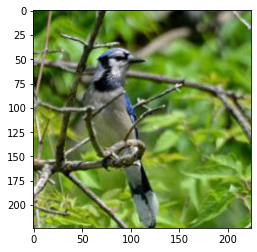

[[7.0801410e-03 2.6506695e-01 9.0988260e-03 1.2692291e-03 3.1015605e-03
  6.2879813e-01 2.8358953e-04 8.2598932e-02 2.7026169e-03]]
[5]
Zdjęcie należy do klasy: 05_insect


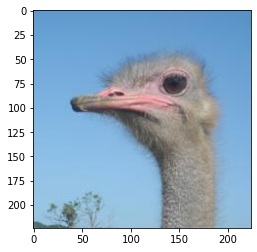

[[1.3920184e-03 9.4528961e-01 6.9314457e-04 2.4714833e-04 9.7941747e-06
  5.2158613e-02 2.9717663e-05 1.7217128e-04 7.8164794e-06]]
[1]
Zdjęcie należy do klasy: 01_bird


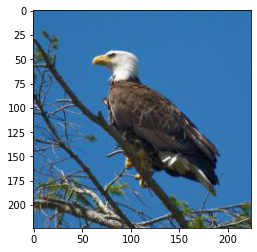

[[8.0957013e-04 9.4962305e-01 5.7333149e-04 8.2366387e-05 3.1803211e-06
  4.8831247e-02 9.6859867e-06 6.3437765e-05 4.1433104e-06]]
[1]
Zdjęcie należy do klasy: 01_bird


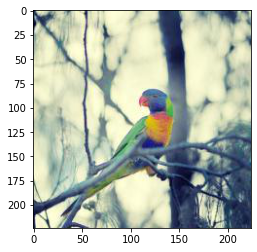

[[0.02506306 0.6326455  0.02274437 0.01376051 0.0036987  0.2763392
  0.01269563 0.00767879 0.00537427]]
[1]
Zdjęcie należy do klasy: 01_bird


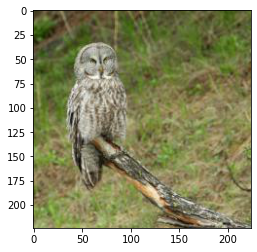

[[0.03575184 0.70400643 0.02396926 0.01602474 0.00405856 0.19235569
  0.00486268 0.0161237  0.002847  ]]
[1]
Zdjęcie należy do klasy: 01_bird


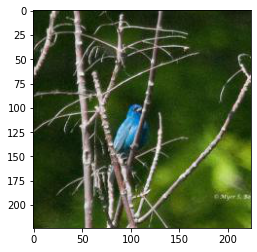

[[6.7743417e-03 2.7315253e-01 1.3156585e-02 2.1129013e-03 2.4772610e-03
  6.5278691e-01 5.4268976e-04 4.6387870e-02 2.6089582e-03]]
[5]
Zdjęcie należy do klasy: 05_insect


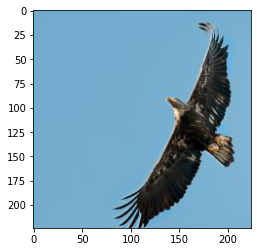

[[0.0430253  0.55026215 0.04256528 0.03050922 0.00639907 0.28225443
  0.00569298 0.0264673  0.01282428]]
[1]
Zdjęcie należy do klasy: 01_bird


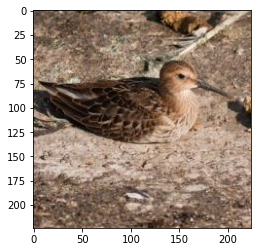

[[1.0946501e-02 8.2060874e-01 1.1197598e-02 2.0207756e-03 3.4537088e-04
  1.5177280e-01 5.3913583e-04 2.0648867e-03 5.0419901e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


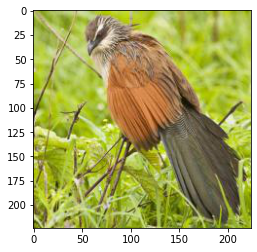

[[8.2599539e-03 7.7609527e-01 8.2080765e-03 2.0303659e-03 4.0910629e-04
  2.0237845e-01 6.6405069e-04 1.5205528e-03 4.3408695e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


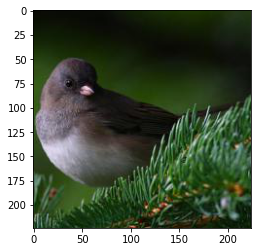

[[1.3258934e-02 7.2544342e-01 2.0862684e-02 1.5476244e-03 6.1384868e-04
  2.3372909e-01 3.0464228e-04 3.3737458e-03 8.6590240e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


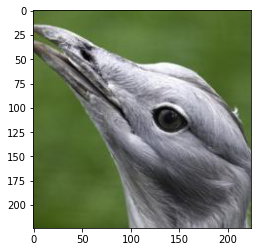

[[0.01330121 0.0043851  0.00371893 0.6771178  0.01287541 0.00997263
  0.00760461 0.03331286 0.2377114 ]]
[3]
Zdjęcie należy do klasy: 03_reptile


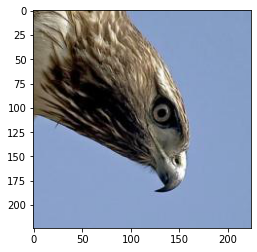

[[0.08719085 0.07664978 0.04012232 0.10219099 0.12553154 0.2747762
  0.02626101 0.05788089 0.2093964 ]]
[5]
Zdjęcie należy do klasy: 05_insect


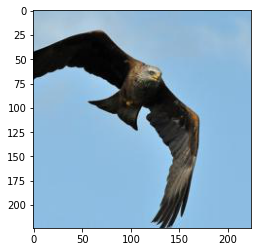

[[0.07391565 0.38127282 0.04037006 0.07185735 0.02124817 0.3214944
  0.05213171 0.01779473 0.01991507]]
[1]
Zdjęcie należy do klasy: 01_bird


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


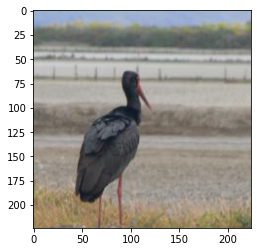

[[4.87623131e-03 8.71122122e-01 4.72141197e-03 6.66249776e-04
  8.30138815e-05 1.17560171e-01 1.19562217e-04 7.42095930e-04
  1.09217435e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


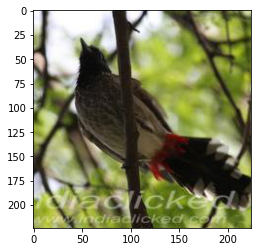

[[0.01580812 0.58482903 0.02318258 0.01079326 0.00342885 0.33869144
  0.00344493 0.0124816  0.00734014]]
[1]
Zdjęcie należy do klasy: 01_bird


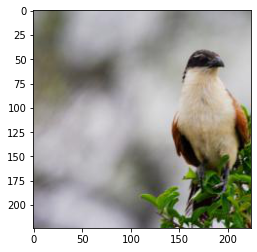

[[1.4274435e-02 8.0464190e-01 1.1107387e-02 3.6393474e-03 6.8428542e-04
  1.6017242e-01 7.8773464e-04 4.1075298e-03 5.8492983e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


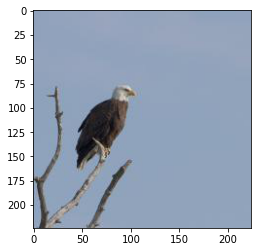

[[1.2862039e-02 8.3014989e-01 9.1047613e-03 3.6628570e-03 5.2956957e-04
  1.3901578e-01 9.0148399e-04 3.2851680e-03 4.8852206e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


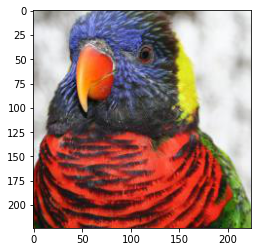

[[0.01064162 0.6277616  0.02823274 0.0020522  0.00099431 0.3201668
  0.00078077 0.00662698 0.00274305]]
[1]
Zdjęcie należy do klasy: 01_bird


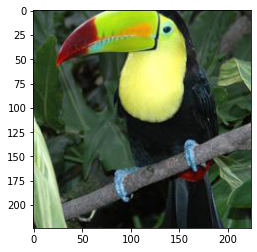

[[0.06730195 0.31735456 0.03182216 0.07745527 0.02765791 0.30509007
  0.12517321 0.01795814 0.03018678]]
[1]
Zdjęcie należy do klasy: 01_bird


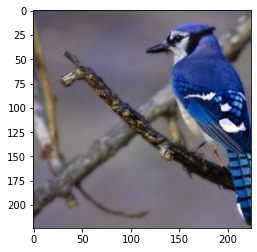

[[6.1759478e-03 8.2576668e-01 5.6064511e-03 1.5920157e-03 2.0922591e-04
  1.5890417e-01 6.0627644e-04 8.7070197e-04 2.6853741e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


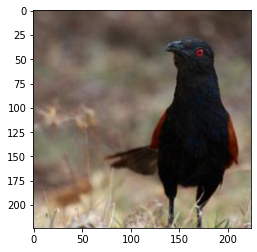

[[4.4118068e-03 8.8756353e-01 4.2446908e-03 6.3322356e-04 6.1203718e-05
  1.0229951e-01 1.4405257e-04 5.3876202e-04 1.0320768e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


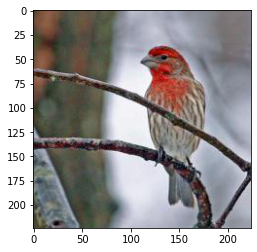

[[1.8395720e-03 9.3209469e-01 1.3566663e-03 2.5501923e-04 1.3090789e-05
  6.4200602e-02 4.4593085e-05 1.7684218e-04 1.8869803e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


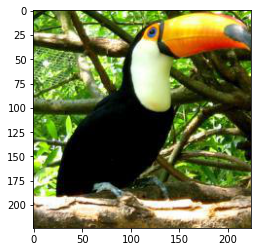

[[0.01818673 0.57306355 0.01853069 0.00517043 0.00254051 0.37299106
  0.00196863 0.00439788 0.00315052]]
[1]
Zdjęcie należy do klasy: 01_bird


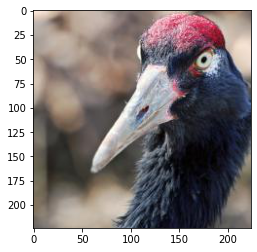

[[1.6042683e-03 9.1512990e-01 1.5257038e-03 1.4062003e-04 1.1472570e-05
  8.1386395e-02 1.5896416e-05 1.7097186e-04 1.4683258e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


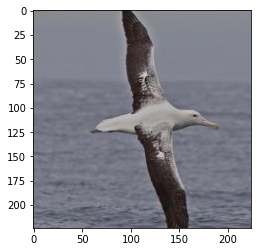

[[1.2059889e-02 8.4258062e-01 9.5016267e-03 3.2622356e-03 3.9826031e-04
  1.2826255e-01 1.0748344e-03 2.3193795e-03 5.4072001e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


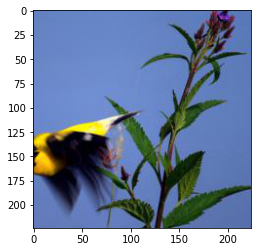

[[0.02205396 0.0175411  0.0563327  0.11257818 0.05550563 0.26363438
  0.05038311 0.02097156 0.4009994 ]]
[8]
Zdjęcie należy do klasy: 08_fish


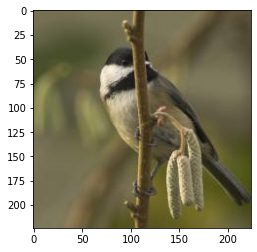

[[0.03394037 0.46703473 0.045545   0.02177405 0.00988773 0.3742343
  0.00591297 0.03071961 0.01095129]]
[1]
Zdjęcie należy do klasy: 01_bird


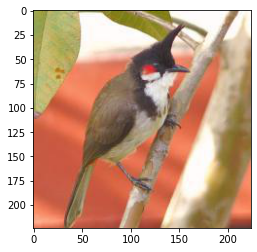

[[0.02342073 0.69958967 0.01790557 0.00774838 0.00254333 0.23067307
  0.00182132 0.0145572  0.00174074]]
[1]
Zdjęcie należy do klasy: 01_bird


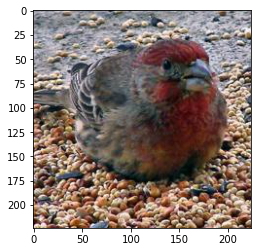

[[0.03024404 0.5923872  0.02859432 0.00768327 0.00390256 0.3103274
  0.00223361 0.02049012 0.00413747]]
[1]
Zdjęcie należy do klasy: 01_bird


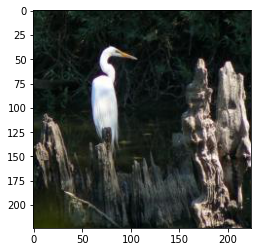

[[4.1457098e-03 9.0678883e-01 2.9397472e-03 8.2155230e-04 5.7740119e-05
  8.4430307e-02 1.8646881e-04 5.5388396e-04 7.5800439e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


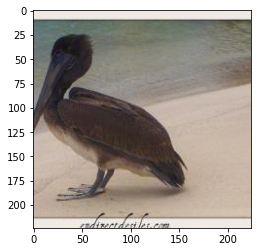

[[0.04956274 0.67962503 0.03313562 0.02117485 0.00436801 0.18084057
  0.01024936 0.01522413 0.00581969]]
[1]
Zdjęcie należy do klasy: 01_bird


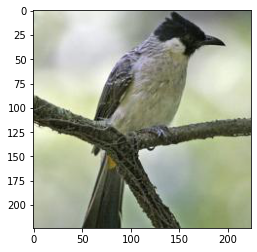

[[9.2884130e-04 9.5649987e-01 4.6813302e-04 1.4830360e-04 4.3251416e-06
  4.1841097e-02 1.9116535e-05 8.5995751e-05 4.2924084e-06]]
[1]
Zdjęcie należy do klasy: 01_bird


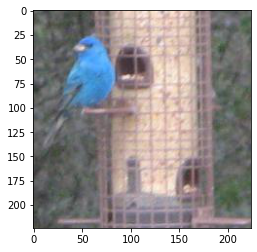

[[0.05834905 0.19344062 0.0620579  0.05792211 0.05020101 0.4345795
  0.069535   0.03402726 0.03988756]]
[5]
Zdjęcie należy do klasy: 05_insect


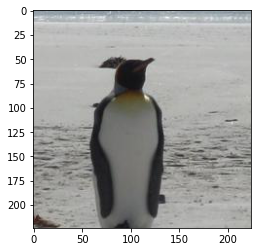

[[0.03797587 0.5191464  0.03185429 0.02591741 0.01737401 0.26374424
  0.0075685  0.08334122 0.01307804]]
[1]
Zdjęcie należy do klasy: 01_bird


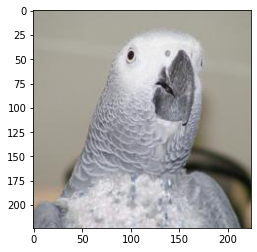

[[0.10597602 0.22148089 0.06708065 0.1484791  0.03205959 0.15521106
  0.10043505 0.08407762 0.0852001 ]]
[1]
Zdjęcie należy do klasy: 01_bird


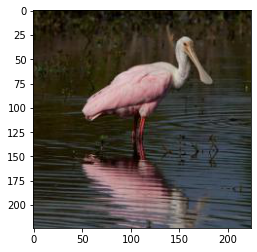

[[8.1699351e-03 8.5182583e-01 6.1064563e-03 1.5458893e-03 1.7148278e-04
  1.3018221e-01 4.1257241e-04 1.3531238e-03 2.3248509e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


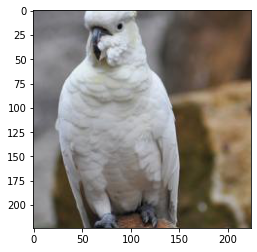

[[0.03904584 0.6577323  0.02620147 0.01491004 0.0054899  0.22744362
  0.00300671 0.02341051 0.00275962]]
[1]
Zdjęcie należy do klasy: 01_bird


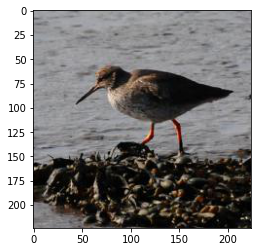

[[1.0511028e-02 8.2792485e-01 9.8900096e-03 2.0612068e-03 3.3289706e-04
  1.4624441e-01 5.1466469e-04 2.0890529e-03 4.3179886e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


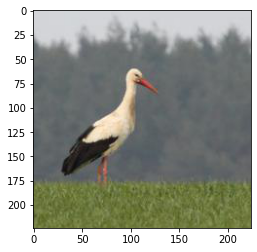

[[2.4272867e-03 9.2450279e-01 1.9250328e-03 3.5863032e-04 2.0139059e-05
  7.0423171e-02 7.7784956e-05 2.3116414e-04 3.4071130e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


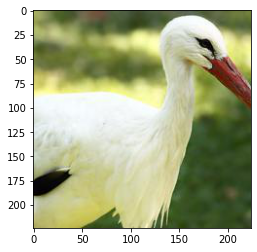

[[2.6678487e-03 9.2345309e-01 2.3577937e-03 3.8873038e-04 2.1077789e-05
  7.0738181e-02 1.0965365e-04 2.1541293e-04 4.8178710e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


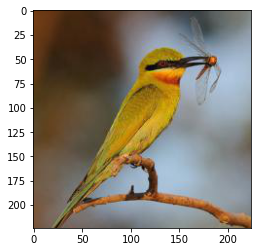

[[0.01873993 0.7701568  0.01712972 0.00616984 0.00105294 0.17844723
  0.00176992 0.00515944 0.00137409]]
[1]
Zdjęcie należy do klasy: 01_bird


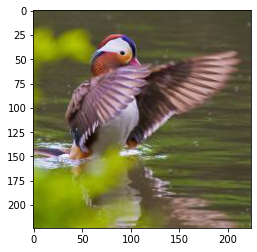

[[0.0462337  0.6018389  0.05230927 0.01462495 0.00466813 0.24649261
  0.00656247 0.01237257 0.01489742]]
[1]
Zdjęcie należy do klasy: 01_bird


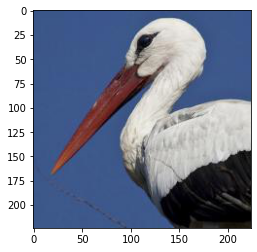

[[2.5124971e-03 9.3181783e-01 1.6927806e-03 4.6427574e-04 2.1393029e-05
  6.3101217e-02 1.1123241e-04 2.4489890e-04 3.3804568e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


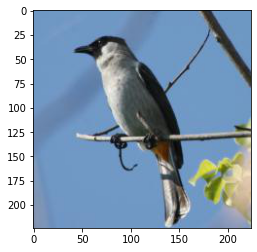

[[9.0022488e-03 8.6060828e-01 5.9918119e-03 2.9975937e-03 2.8677724e-04
  1.1812074e-01 1.0586156e-03 1.6021583e-03 3.3181428e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


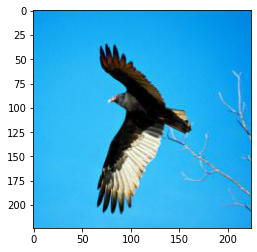

[[1.1389675e-02 8.1209457e-01 1.4162018e-02 2.3488416e-03 2.3331746e-04
  1.5666842e-01 7.9524383e-04 1.3912631e-03 9.1668096e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


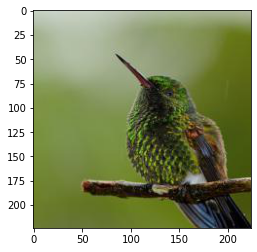

[[1.4035453e-02 8.1278521e-01 1.1246716e-02 3.6068999e-03 6.1127712e-04
  1.5263270e-01 9.1115426e-04 3.5484424e-03 6.2221091e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


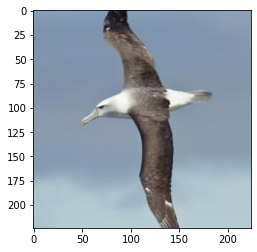

[[1.5457981e-02 8.0280966e-01 1.2753863e-02 4.0299334e-03 7.2129897e-04
  1.5842865e-01 1.0766338e-03 3.9586644e-03 7.6336437e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


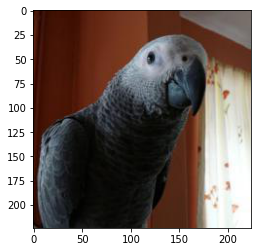

[[0.11663798 0.07704319 0.05644115 0.3312291  0.02544428 0.07145892
  0.13508254 0.04418254 0.14248036]]
[3]
Zdjęcie należy do klasy: 03_reptile


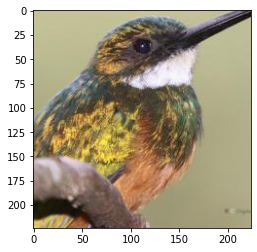

[[8.8747060e-03 8.2054442e-01 6.7653544e-03 1.7373626e-03 3.4930417e-04
  1.5853724e-01 2.2343092e-04 2.7558454e-03 2.1235371e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


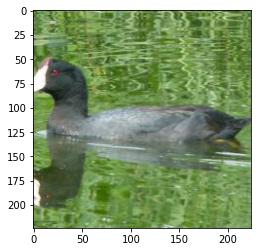

[[0.0540449  0.6276901  0.03651496 0.0250533  0.00882986 0.2015296
  0.00567845 0.02899115 0.0116676 ]]
[1]
Zdjęcie należy do klasy: 01_bird


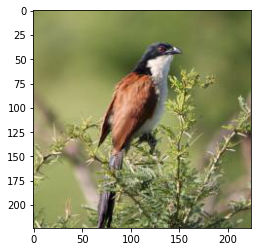

[[2.4971690e-03 9.1899991e-01 1.8471645e-03 3.7159305e-04 2.4218320e-05
  7.5871423e-02 6.2235435e-05 2.9622228e-04 3.0137251e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


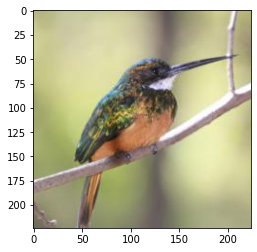

[[4.20696149e-03 8.87962997e-01 4.44173347e-03 5.49432356e-04
  5.28166784e-05 1.02089494e-01 1.34992049e-04 4.55970207e-04
  1.05586871e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


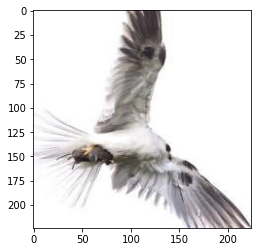

[[0.00594895 0.05108758 0.0188052  0.00917248 0.01721992 0.8134247
  0.0538151  0.0070557  0.02347033]]
[5]
Zdjęcie należy do klasy: 05_insect


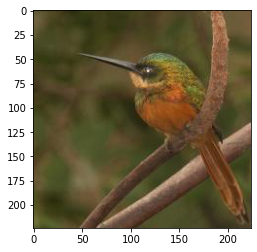

[[0.05021372 0.6244442  0.04484352 0.02319616 0.00619894 0.2127128
  0.01246633 0.01706253 0.00886177]]
[1]
Zdjęcie należy do klasy: 01_bird


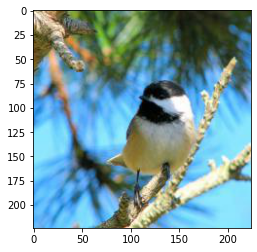

[[0.00703282 0.4957423  0.01116666 0.00335527 0.00298789 0.46521074
  0.00170041 0.01097659 0.00182725]]
[1]
Zdjęcie należy do klasy: 01_bird


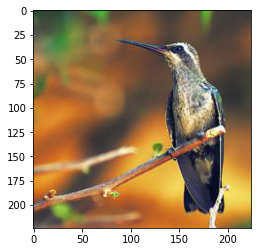

[[0.01245126 0.56285495 0.01528415 0.00589741 0.00242319 0.3912501
  0.00502564 0.00241547 0.0023979 ]]
[1]
Zdjęcie należy do klasy: 01_bird


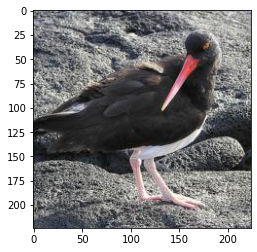

[[4.3446519e-03 8.7252980e-01 4.1605071e-03 5.5345992e-04 7.1190370e-05
  1.1748227e-01 8.4614949e-05 6.8983558e-04 8.3644387e-05]]
[1]
Zdjęcie należy do klasy: 01_bird


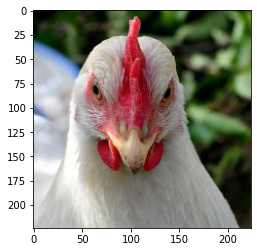

[[0.03376294 0.33094677 0.04175126 0.03354565 0.02460005 0.4820843
  0.0236302  0.01077161 0.01890726]]
[5]
Zdjęcie należy do klasy: 05_insect


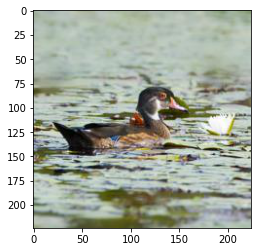

[[0.02530409 0.79167527 0.01890985 0.00643141 0.00084311 0.14785181
  0.00299886 0.00406429 0.00192129]]
[1]
Zdjęcie należy do klasy: 01_bird


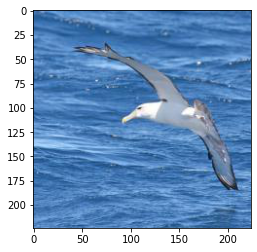

[[0.02144011 0.748458   0.02031976 0.00783331 0.00139729 0.19004898
  0.00278709 0.00570898 0.00200642]]
[1]
Zdjęcie należy do klasy: 01_bird


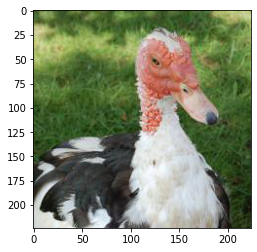

[[8.3726784e-03 8.3183163e-01 8.9853201e-03 1.2792832e-03 2.1734282e-04
  1.4723749e-01 2.8441232e-04 1.4815573e-03 3.1033793e-04]]
[1]
Zdjęcie należy do klasy: 01_bird


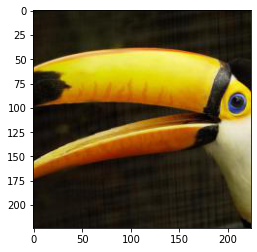

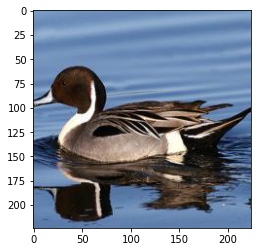

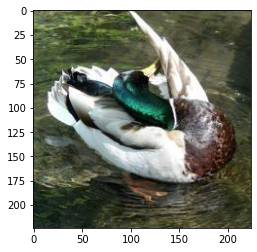

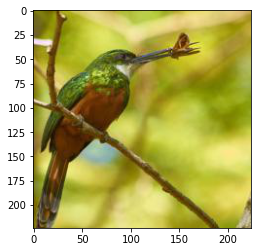

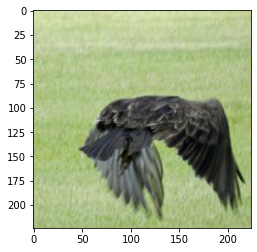

...

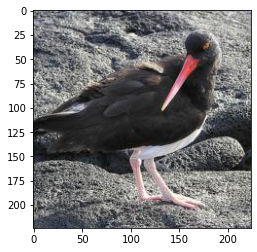

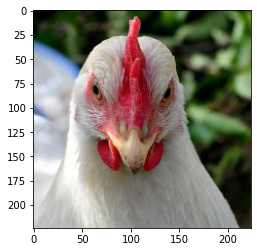

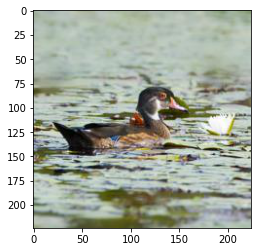

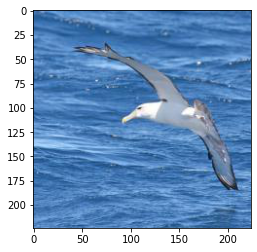

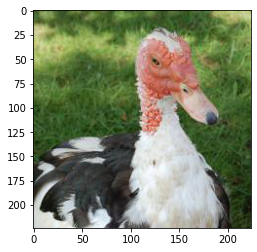

In [ ]:
import matplotlib.pyplot as plt
import glob

files = glob.glob('/dataset/generator_results/test/01_bird/*')
# for dir in dirs:
#   files = glob.glob(dir + '/*')
for file in files:
    image = _image_to_array(file, input_size[:2])
    fig = plt.figure()
    plt.imshow(image)
    display(fig)
    image = np.expand_dims(image, axis=0) # macierz o rozmiarze wejściowym sieci
    y = model.predict(image)
    print(y) #wektor prawdopodobieństw

    print(np.argmax(y, axis=1)) # wyciągnięcie indeksu wartości, która jest najwyższa w wektorze y 
    predictedClass = np.argmax(y, axis=1)
    print("Zdjęcie należy do klasy: " + idx_classes_dict.get(predictedClass[0], '19'))   
    print("=================================================================")